# Test uniformity of Thorlabs 300 grating with Halpha filter scanning
==================================================================================================

- author : Jérémy Neveu
- date   : June 9th 2017


In [3]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [4]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

print theNotebook
from IPython.display import Image, display
import sys
sys.path.append("../../common_tools/")
from common_notebook import *

init_notebook()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
ScanThor300_Halpha
ccdproc version 1.2.0
bottleneck version 1.2.0
/Users/jneveu/Documents/LSST/Calibration/CTIOAnaJun2017/ana_09jun17/ScanThor300_Halpha


### Input directory

In [5]:
inputdir="../OverScanRemove/trim_images"
#inputdir="../../data/CTIODataJune2017_reducedRed/data_09jun17/"
MIN_IMGNUMBER=183
MAX_IMGNUMBER=207
date = "20170609"
tag = "trim"
holo_name = "Thor300"
object_name='HD111980'
SelectTagRe='^%s_%s_([0-9]+).fits$' % (tag,date) # regular expression to select the file
SearchTagRe='^%s_%s_[0-9]+.fits$' % (tag,date)
NBIMGPERROW=2

### Output directories

In [6]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images
ensure_dir(dir_top_images) # create that directory

outputdir="./cut_fitsimages"
ensure_dir(outputdir)

## Location of the spectra
----------------------------------

In [7]:
dirlist_all = [inputdir]
sorted_numbers,sorted_files = MakeFileList(dirlist_all,MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


### Show images

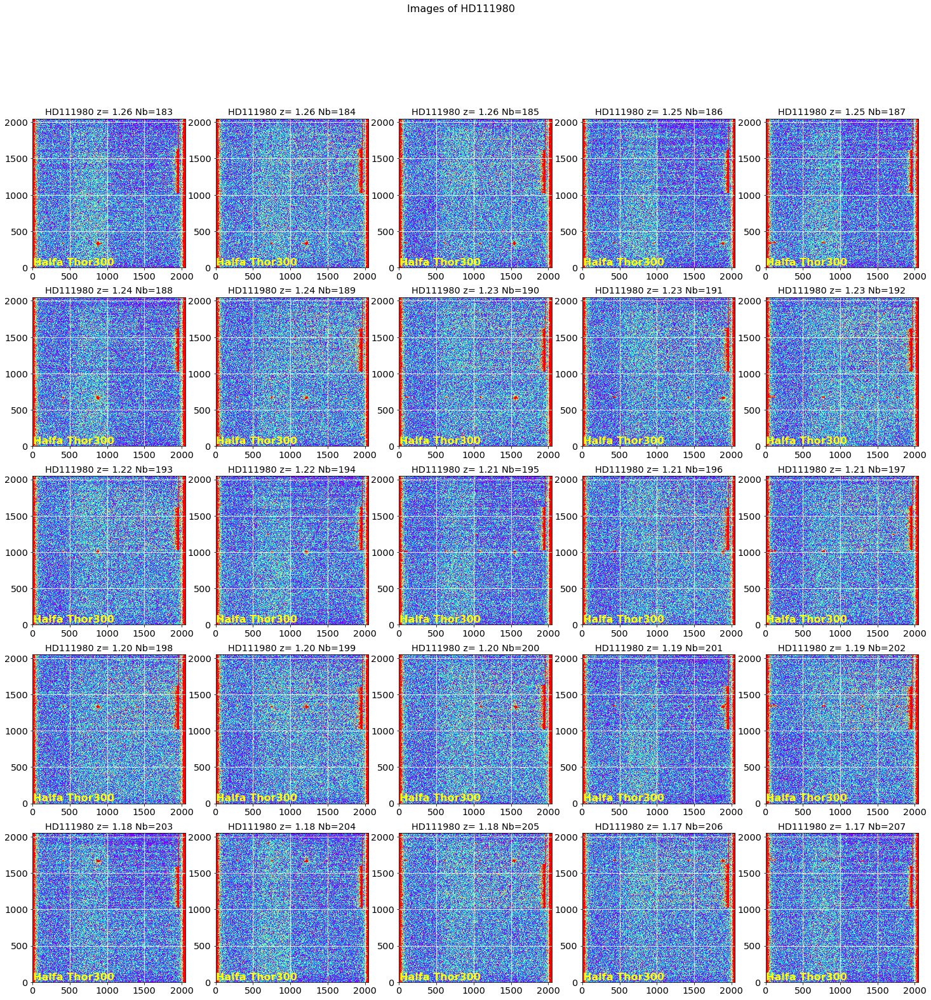

In [8]:
ShowImages(all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=20,downsampling=1,verbose=False)

figfilename=os.path.join(dir_top_images,'input_images.pdf')
plt.savefig(figfilename)   

### Show histograms

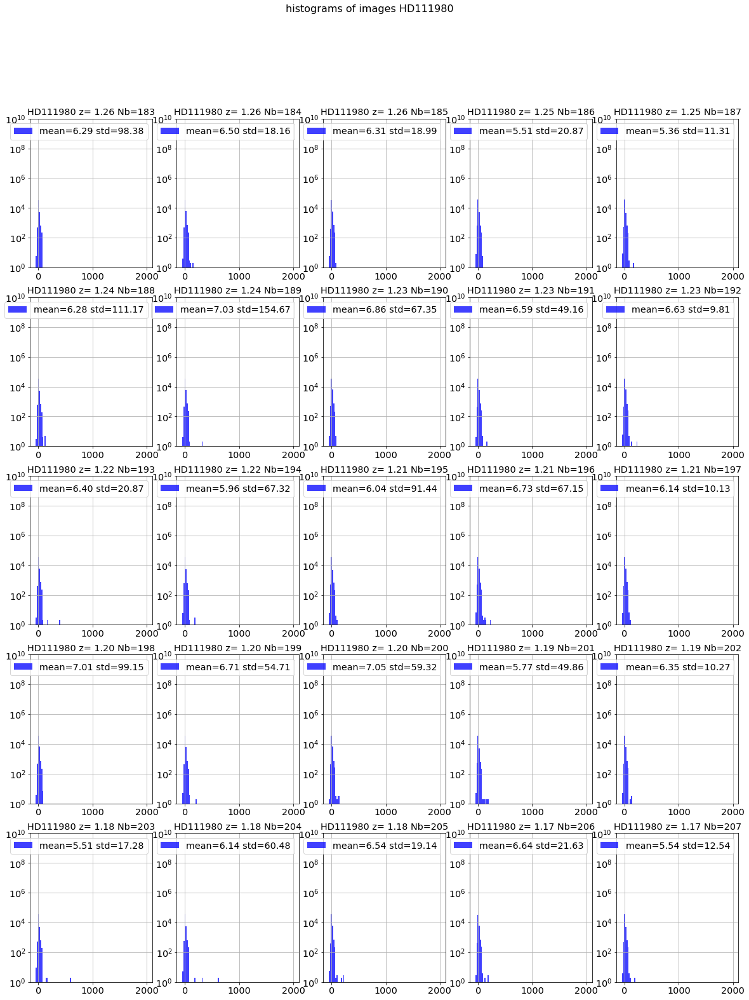

In [9]:
ShowHistograms(all_images,all_titles,all_filt,object_name,
               NBIMGPERROW=5,bins=100,range=(-50,2000),downsampling=10,verbose=False)

### Cut the images

To extract the spectra to analyze

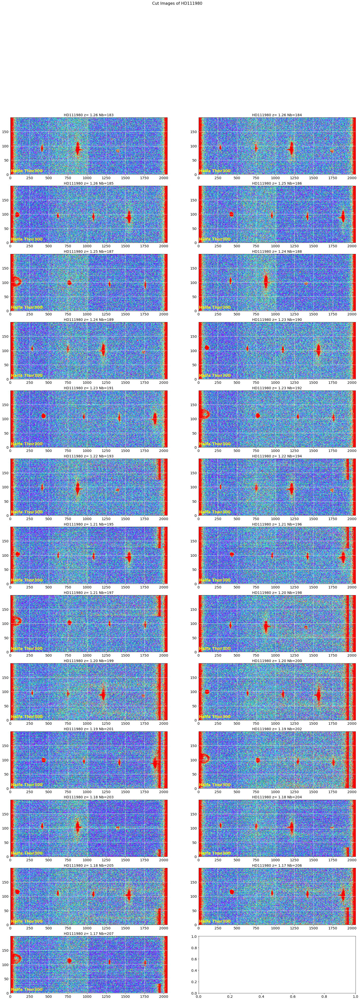

In [10]:
x_guess = [398,  740, 1076, 1403, 1741]*5
y_guess = [[340]*5, [660]*5, [1000]*5, [1340]*5, [1660]*5]
y_guess = [val for sublist in y_guess for val in sublist]
DeltaY=[100]*len(all_images)
DeltaX=[2000]*len(all_images)  # must be very large to be able to compute incident angle

images_raw=ShowCenterImages(x_guess,y_guess,DeltaX,DeltaY,all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=20)
figfilename=os.path.join(dir_top_images,'cut_images.pdf')
plt.savefig(figfilename)   

### Save cut images

In [11]:
newfullfilenames=[]
for idx,file in np.ndenumerate(sorted_files):
    short_infilename=file.split("/")[-1]
    print short_infilename
    short_partfilename=re.findall('^%s_(.*)' % tag,short_infilename)
    short_outfilename='cutimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)
    
for idx,file in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_raw[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(file,overwrite=True)

trim_20170609_183.fits
trim_20170609_184.fits
trim_20170609_185.fits
trim_20170609_186.fits
trim_20170609_187.fits
trim_20170609_188.fits
trim_20170609_189.fits
trim_20170609_190.fits
trim_20170609_191.fits
trim_20170609_192.fits
trim_20170609_193.fits
trim_20170609_194.fits
trim_20170609_195.fits
trim_20170609_196.fits
trim_20170609_197.fits
trim_20170609_198.fits
trim_20170609_199.fits
trim_20170609_200.fits
trim_20170609_201.fits
trim_20170609_202.fits
trim_20170609_203.fits
trim_20170609_204.fits
trim_20170609_205.fits
trim_20170609_206.fits
trim_20170609_207.fits


In [12]:
!ls -l cut_fitsimages/*

-rw-r--r--  1 jneveu  staff  3288960  9 aoû 16:29 cut_fitsimages/cutimg_20170609_183.fits
-rw-r--r--  1 jneveu  staff  3288960  9 aoû 16:29 cut_fitsimages/cutimg_20170609_184.fits
-rw-r--r--  1 jneveu  staff  3288960  9 aoû 16:29 cut_fitsimages/cutimg_20170609_185.fits
-rw-r--r--  1 jneveu  staff  3288960  9 aoû 16:29 cut_fitsimages/cutimg_20170609_186.fits
-rw-r--r--  1 jneveu  staff  3288960  9 aoû 16:29 cut_fitsimages/cutimg_20170609_187.fits
-rw-r--r--  1 jneveu  staff  3288960  9 aoû 16:29 cut_fitsimages/cutimg_20170609_188.fits
-rw-r--r--  1 jneveu  staff  3288960  9 aoû 16:29 cut_fitsimages/cutimg_20170609_189.fits
-rw-r--r--  1 jneveu  staff  3288960  9 aoû 16:29 cut_fitsimages/cutimg_20170609_190.fits
-rw-r--r--  1 jneveu  staff  3288960  9 aoû 16:29 cut_fitsimages/cutimg_20170609_191.fits
-rw-r--r--  1 jneveu  staff  3288960  9 aoû 16:29 cut_fitsimages/cutimg_20170609_192.fits
-rw-r--r--  1 jneveu  staff  3288960  9 aoû 16:29 cut_fitsimages/cutimg_20170609_193.fits
-rw-r--r--

# Find the optimal rotation of the spectra
============================

In [13]:
inputdir="./cut_fitsimages"
SelectTagRe='^cutimg_%s_([0-9]+).fits$' % date # regular expression to select the file
SearchTagRe='^cutimg_%s_[0-9]+.fits$' % date

outputdir="./rotated_fitsimages"
ensure_dir(outputdir)

In [14]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


## Find rotation by Hessian analysis

La méthode s'inspire des techniques de détection de filmanents dans le milieu interstellaire.
Elle est décrite dans https://arxiv.org/pdf/1409.6728.pdf section 4.1.
Documentation sur le calcul du Hessien : http://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.hessian_matrix

### Test rotation optimal settings

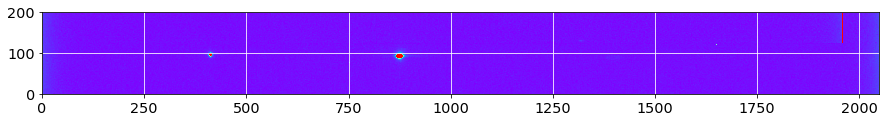

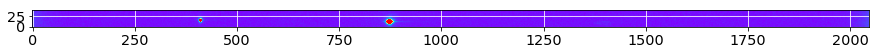

In [15]:
sel=10
image_sel=np.copy(all_images[sel])
y0=DeltaY[sel]
x0=x_guess[sel]

width_cut = 20
right_edge = IMSIZE

plt.imshow(image_sel,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

region=np.copy(image_sel[y0-width_cut:y0+width_cut,0:right_edge])
data=np.copy(region)
plt.imshow(data,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

In [16]:
# le paramètre sigma permet de lisser le hessien
Hxx, Hxy, Hyy = hessian_matrix(data, sigma=3, order = 'xy')
lambda_plus = 0.5*( (Hxx+Hyy) + np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
lambda_minus = 0.5*( (Hxx+Hyy) - np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
theta = 0.5*np.arctan2(2*Hxy,Hyy-Hxx)*180/np.pi

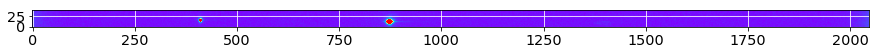

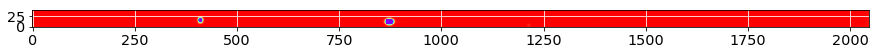

In [17]:
plt.imshow(data,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()
plt.imshow(lambda_minus,origin='lower',cmap='rainbow',vmin=-100,vmax=0)
plt.grid(color='white', ls='solid')
plt.show()

Number of remaining pixels : 652


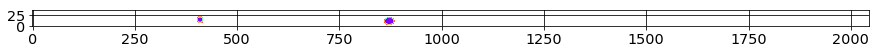

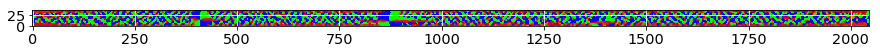

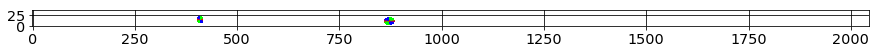

In [18]:
lambda_threshold = -10
margin_cut = 1

lambda_minus = lambda_minus[margin_cut:-margin_cut,margin_cut:-margin_cut]
lambda_plus = lambda_plus[margin_cut:-margin_cut,margin_cut:-margin_cut]
theta = theta[margin_cut:-margin_cut,margin_cut:-margin_cut]

mask = np.where(lambda_minus>lambda_threshold)
lambda_mask = np.copy(lambda_minus)
lambda_mask[mask]=np.nan

theta_mask = np.copy(theta)
theta_mask[mask]=np.nan

print 'Number of remaining pixels :',len(lambda_mask[~np.isnan(lambda_mask)])

plt.imshow(lambda_mask,origin='lower',cmap='rainbow',vmin=-100,vmax=0)
plt.grid(color='black', ls='solid')
plt.show()

plt.imshow(theta,origin='lower',cmap=cm.brg,vmin=-30,vmax=30)
plt.grid(color='white', ls='solid')
plt.show()

plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-30,vmax=30)
plt.grid(color='black', ls='solid')
plt.show()

Number of remaining pixels : 151


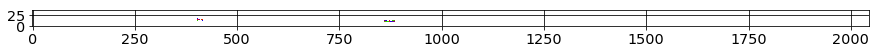

In [19]:
deg_threshold = 20

mask2 = np.where(np.abs(theta)>deg_threshold)
theta_mask[mask2] = np.nan
print 'Number of remaining pixels :',len(theta_mask[~np.isnan(theta_mask)])
plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-deg_threshold,vmax=deg_threshold)
plt.grid(color='black', ls='solid')
plt.show()

Angle median : -1.18547269566


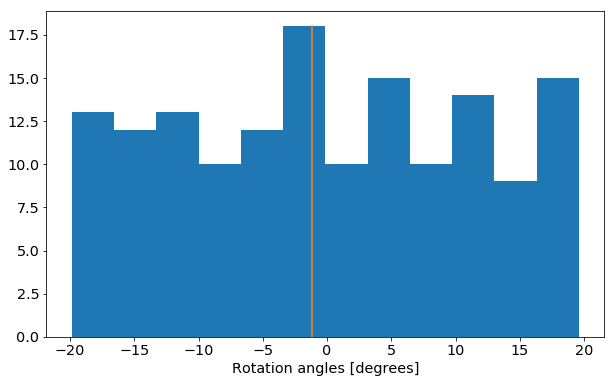

In [20]:
theta_hist = []
theta_hist = theta_mask[~np.isnan(theta_mask)].flatten()
theta_median = np.median(theta_hist)
print 'Angle median :',theta_median
fig = plt.figure(figsize=(10,6))
n,bins, patches = plt.hist(theta_hist,bins=int(np.sqrt(len(theta_hist))))
plt.plot([theta_median,theta_median],[0,np.max(n)])
plt.xlabel("Rotation angles [degrees]")
plt.show()

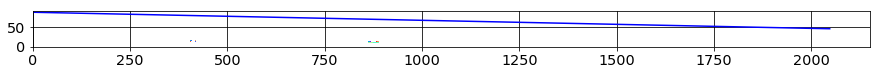

In [21]:
xindex=np.arange(data.shape[1])
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = y0 - width_cut + (x_new-x0)*np.tan(theta_median*np.pi/180.)
plt.imshow(theta_mask,origin='lower',cmap='rainbow',vmin=-deg_threshold,vmax=deg_threshold)
plt.plot(x_new,y_new,'b-')
plt.grid(color='black', ls='solid')
plt.show()

On peut aussi essayer de fitter le spectre qui a été détecté par la méthode ci-dessus.

Rotation angle from fit : -0.430465542825


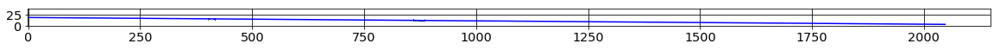

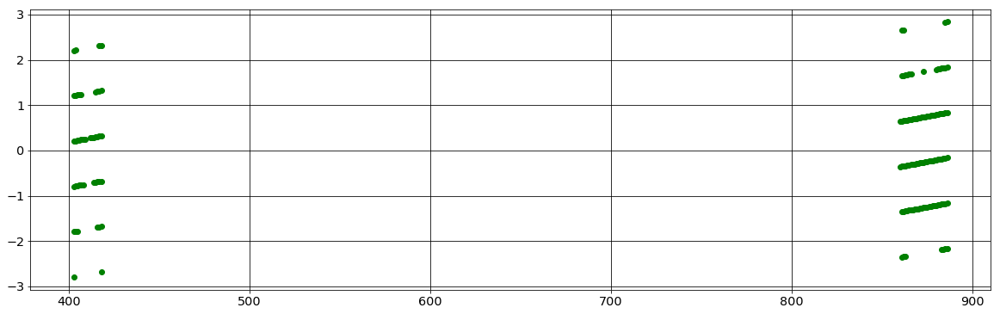

In [22]:
xtofit=[]
ytofit=[]
for iy,y in enumerate(theta_mask):
    for ix,x in enumerate(y):
        if not np.isnan(theta_mask[iy][ix]) :
            if np.abs(theta_mask[iy][ix])>deg_threshold : continue
            xtofit.append(ix)
            ytofit.append(iy)
popt, pcov = fit_line(xtofit, ytofit)
[a, b] = popt
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = line(x_new,a,b)
print 'Rotation angle from fit :',np.arctan(a)*180/np.pi
fig = plt.figure(figsize=[20,6])
plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-deg_threshold,vmax=deg_threshold)
plt.plot(x_new,y_new,'b-')
plt.grid(color='black', ls='solid')
plt.show()
fig = plt.figure(figsize=[20,6])
diff = []
for ix,x in enumerate(xtofit):
    diff.append(ytofit[ix]-line(x,a,b))
plt.plot(xtofit,diff,'go')
plt.grid(color='black', ls='solid')
plt.show()

0  theta =  -0.441501083152
1  theta =  -0.441170908752
2  theta =  -0.440000036611
3  theta =  -0.447636635177
4  theta =  -0.420995610839
5  theta =  -0.440659425534
6  theta =  -0.43823115073
7  theta =  -0.452003243103
8  theta =  -0.439696659663
9  theta =  -0.434343134775
10  theta =  -0.430465542825
11  theta =  -0.44029931429
12  theta =  -0.451269739655
13  theta =  -0.456175936409
14  theta =  -0.473462667604
15  theta =  -0.44426130147
16  theta =  -0.452065155966
17  theta =  -0.450514192368
18  theta =  -0.45107975316
19  theta =  -0.474596179214
20  theta =  -0.423700463335
21  theta =  -0.456788860114
22  theta =  -0.43708415151
23  theta =  -0.476331393511
24  theta =  -0.522016819653


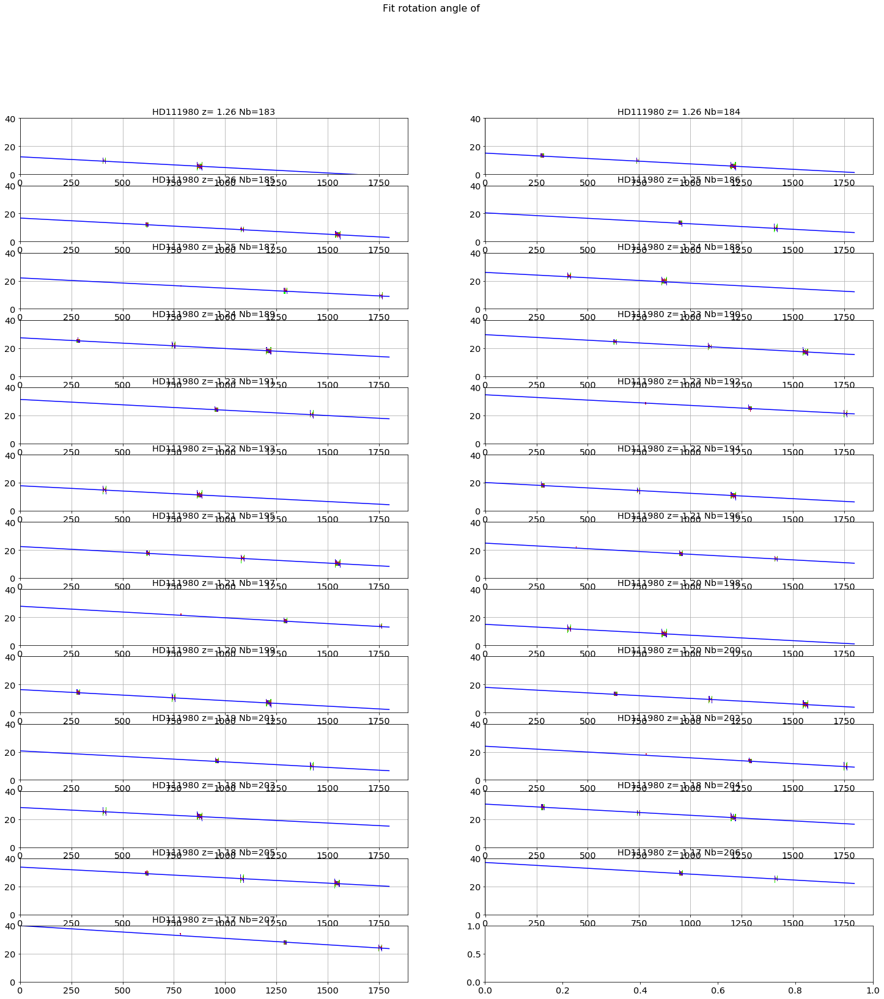

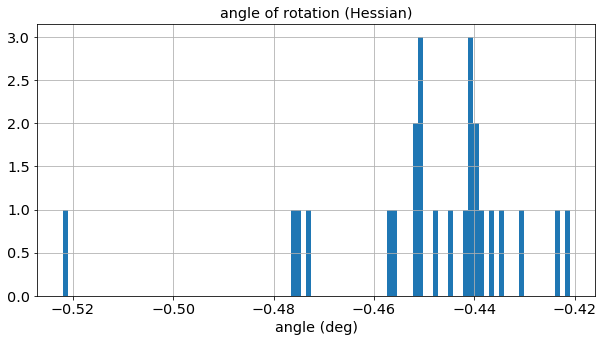

In [23]:
all_theta=ComputeRotationAngleHessianAndFit(all_images,x_guess,DeltaY,all_titles,object_name, 
   NBIMGPERROW=2, lambda_threshold = -10, deg_threshold = 20, width_cut = 20, right_edge = 1800, margin_cut=1)
figfilename=os.path.join(dir_top_images,'fit_rotation.pdf')
plt.savefig(figfilename)  

for index in range(len(all_theta)):
    print index,' theta = ',all_theta[index]
plt.figure(figsize=(10,5))
n, bins, patches=plt.hist(all_theta,bins=100,histtype='stepfilled')
plt.grid(True)
plt.title('angle of rotation (Hessian)')
plt.xlabel('angle (deg)')

### Turn the images accordingly

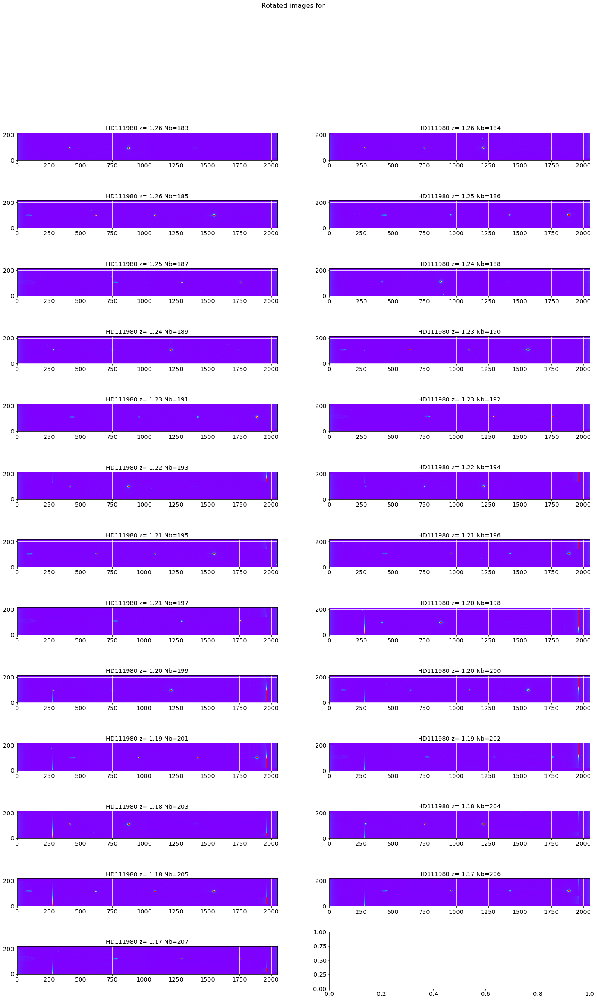

In [24]:
turned_images=TurnTheImages(all_images,all_theta,all_titles,object_name,NBIMGPERROW=2,
                            oversample_factor=1) 
figfilename=os.path.join(dir_top_images,'rotated_images.pdf')
plt.savefig(figfilename)  

### Check rotation

In case of bad rotation, check by eye

array([-0.01004226,  0.00209148, -0.00555942,  0.02089228, -0.01377113,
        0.00230581, -0.01100353,  0.0082387 ,  0.00455044,  0.00528655,
       -0.01140821,  0.00205076,  0.00278059, -0.00329164, -0.00222529,
        0.01083413, -0.00231222,  0.00774511, -0.01313734,  0.01013598,
       -0.00423566,  0.00154379, -0.0065859 , -0.0169947 ,  0.01603467])

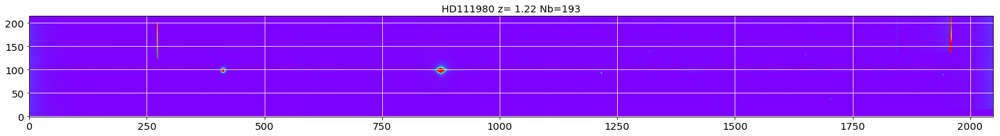

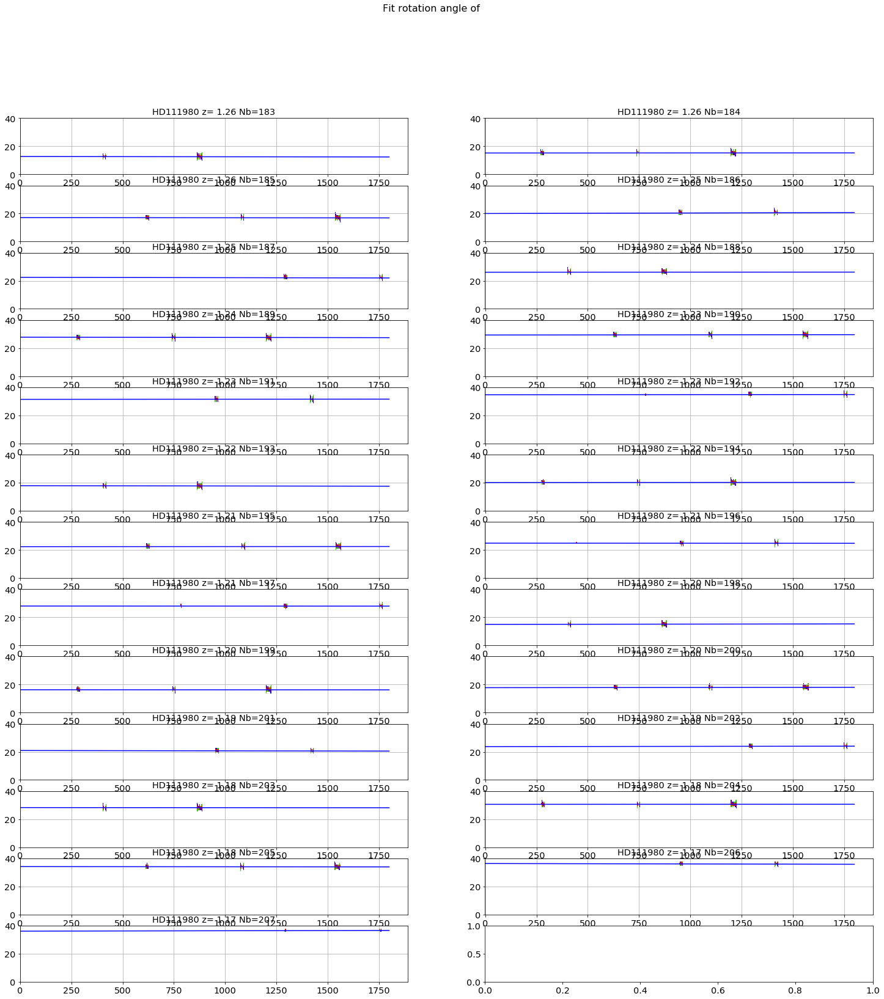

In [25]:
sel=10
plt.figure(figsize=(25,10))
plt.imshow(turned_images[sel],origin='lower',cmap='rainbow',vmin=0,vmax=1000)
plt.grid(True)
plt.title(all_titles[sel])
plt.grid(color='white', ls='solid')
figfilename=os.path.join(dir_top_images,'rotated_image_sample.pdf')
plt.savefig(figfilename)  

ComputeRotationAngleHessianAndFit(turned_images,x_guess,DeltaY,all_titles,object_name, 
            NBIMGPERROW=2, lambda_threshold = -10, deg_threshold = 20, width_cut = 20, right_edge = 1800)

Cut the extra spectra that pollute the images.

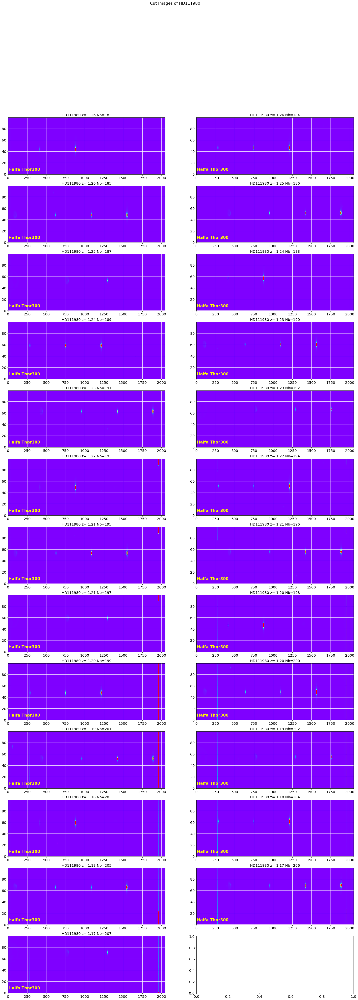

In [26]:
DeltaY_rot2 = [50]*len(all_images)
y_guess_rot2 = [100]*len(all_images)
images_cut_rot=ShowCenterImages(x_guess,y_guess_rot2,DeltaX,DeltaY_rot2,
                    turned_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=5000) 

# Find the central star locations
======================================

### Central star positions after rotation

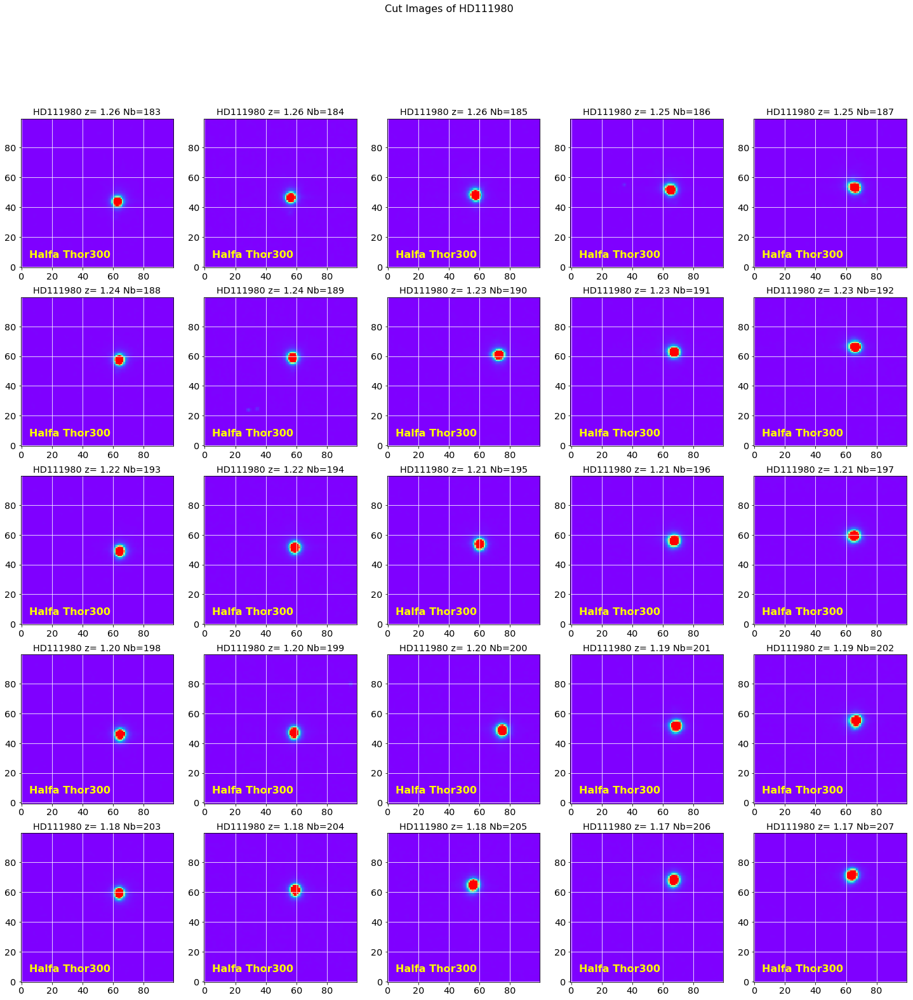

In [27]:
x_guess_rot = x_guess
y_guess_rot = DeltaY_rot2
DeltaY_rot = [50]*len(all_images)
DeltaX_rot = [50]*len(all_images)

images_cut=ShowCenterImages(x_guess_rot,y_guess_rot,DeltaX_rot,DeltaY_rot,
                    images_cut_rot,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000) 

In [28]:
# (JN) valeurs optimisées pour cette étude
img_mean,img_median,img_std,img_sources=ComputeStatImages(images_cut,fwhm=5,threshold=200,sigma=10.0,iters=5)

----------------------------------------------------------------
0  mean, median, std =  6.10407904259 4.85865751435 7.79361948009
 id   xcentroid     ycentroid   ...      peak          flux          mag      
--- ------------- ------------- ... ------------- ------------- --------------
  1 62.4663445337 43.5617601442 ... 12785.3949301 11.9963448585 -2.69762235479
----------------------------------------------------------------
1  mean, median, std =  8.44489399806 7.22605718175 7.5989990013
 id   xcentroid     ycentroid   ...      peak          flux          mag      
--- ------------- ------------- ... ------------- ------------- --------------
  1 56.3172207111 46.2729497555 ... 14269.7523085 13.5715107383 -2.83157048665
----------------------------------------------------------------
2  mean, median, std =  7.10834826523 5.85574523485 7.94632802974
 id   xcentroid     ycentroid   ...      peak          flux          mag      
--- ------------- ------------- ... ------------- -----

        Use DAOStarFinder instead. [astropy.utils.decorators]


----------------------------------------------------------------
9  mean, median, std =  7.63871209545 6.43762737891 7.75434858449
 id   xcentroid     ycentroid   ...      peak          flux          mag      
--- ------------- ------------- ... ------------- ------------- --------------
  1 65.9821805871 65.9019753435 ... 10207.3280667 9.41180157909 -2.43418190686
----------------------------------------------------------------
10  mean, median, std =  5.24757855438 4.18397842665 7.16640646217
 id   xcentroid     ycentroid   ...      peak          flux          mag      
--- ------------- ------------- ... ------------- ------------- --------------
  1 64.1437633827 48.7215282666 ... 12804.9360516 12.8567698384 -2.77282967311
----------------------------------------------------------------
11  mean, median, std =  8.21905043228 7.08688635544 7.48842858592
 id  xcentroid     ycentroid   ...      peak          flux          mag      
--- ------------ ------------- ... ------------- ----

### Central star position

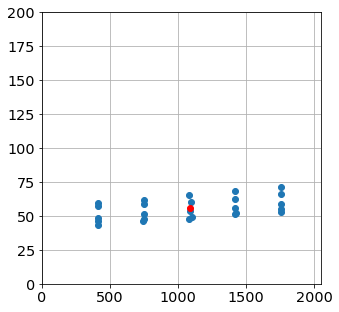

In [29]:
x_star = []
y_star = []
for index,s in enumerate(img_sources):
    thestar = None
    test = -1
    for ss in s:
        x_star.append(ss['xcentroid']+x_guess_rot[index]-DeltaX_rot[index])
        y_star.append(ss['ycentroid']+y_guess_rot[index]-DeltaY_rot[index])
        
x_mean = np.mean(x_star)
y_mean = np.mean(y_star)
img_size=all_images[0].shape
plt.figure(figsize=(5,5))
plt.plot(x_star,y_star,'o')
plt.plot(x_mean,y_mean,'ro')
plt.xlim(0,img_size[1])
plt.ylim(0,img_size[0])
plt.grid(True)

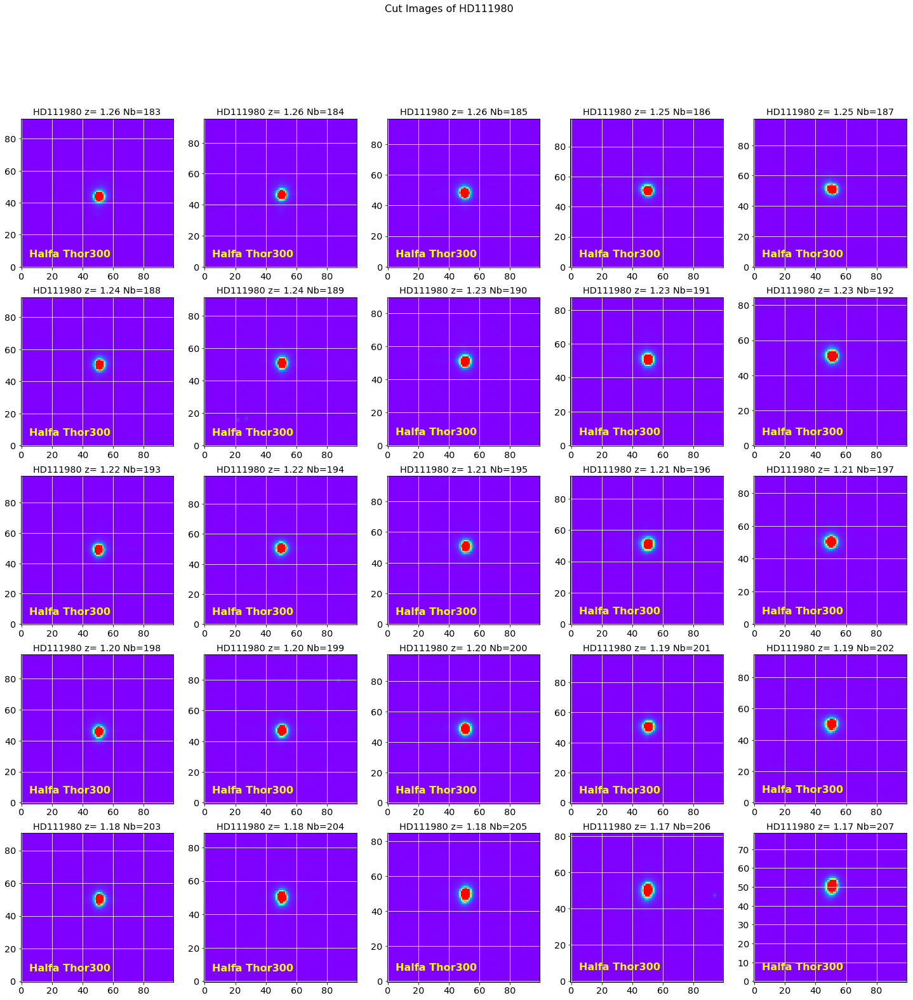

In [30]:
images_cut=ShowCenterImages(x_star,y_star,DeltaX_rot,DeltaY_rot,
                    images_cut_rot,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000) 

## Pointing positions before rotations

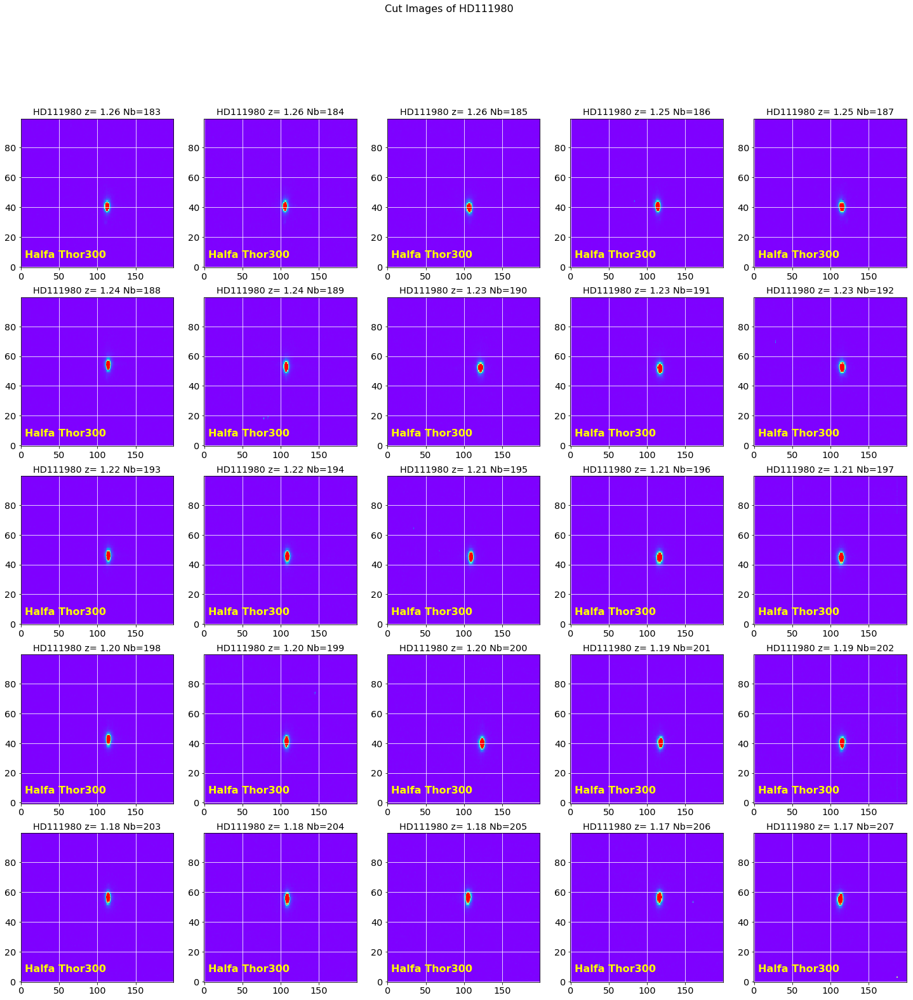

In [31]:
DeltaY_rot = [50]*len(all_images)
DeltaX_rot = [100]*len(all_images)
images_raw_cut=ShowCenterImages(x_guess,DeltaY,DeltaX_rot,DeltaY_rot,
                    images_raw,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000) 

In [32]:
# (JN) valeurs optimisées pour cette étude
img_mean,img_median,img_std,img_sources=ComputeStatImages(images_raw_cut,fwhm=5,threshold=200,sigma=10.0,iters=5)

----------------------------------------------------------------
0  mean, median, std =  5.01787782646 5.0 6.78535378625
 id   xcentroid     ycentroid   ...   peak       flux          mag      
--- ------------- ------------- ... ------- ------------- --------------
  1 111.863863092 40.2896565127 ... 19920.0 19.1185233881 -3.20363586667
----------------------------------------------------------------
1  mean, median, std =  7.26932178642 7.0 6.90191955315
 id  xcentroid    ycentroid   ...   peak       flux          mag      
--- ----------- ------------- ... ------- ------------- --------------
  1 105.7464336 40.4259185698 ... 20245.0 18.9939293211 -3.19653704401
----------------------------------------------------------------
2  mean, median, std =  5.96272979098 6.0 7.06731464493
 id   xcentroid     ycentroid   ...   peak       flux          mag      
--- ------------- ------------- ... ------- ------------- --------------
  1 106.560880504 39.5112369786 ... 14742.0 14.7627450756 -

[[  409.86386309   330.28965651]
 [  745.7464336    330.42591857]
 [ 1082.5608805    329.51123698]
 [ 1417.22673155   330.41118544]
 [ 1756.31765704   330.07996407]
 [  411.37252236   663.81922743]
 [  747.00881878   662.75955928]
 [ 1097.47009694   661.96519444]
 [ 1420.0798386    661.47586784]
 [ 1756.52469935   662.36213056]
 [  411.59965469   995.81768368]
 [  748.49809459   995.29660626]
 [ 1084.89530877   995.01983127]
 [ 1419.58519997   994.77815479]
 [ 1755.27191192   994.54834763]
 [  411.79715678  1332.86443516]
 [  747.48379215  1331.59276904]
 [ 1099.53937609  1330.35914869]
 [ 1420.8071653   1330.65320653]
 [ 1756.50060834  1330.64951131]
 [  411.36521154  1666.35833837]
 [  748.54922172  1665.71558982]
 [ 1081.28966939  1666.60853726]
 [ 1419.35650095  1666.46658669]
 [ 1753.96244404  1665.41019828]]
[410.46634453366988, 746.31722071105833, 1083.1374624536679, 1418.2820873447886, 1756.8408813811068, 411.86348805904379, 747.51219105465964, 1098.4503955041982, 1420.53861279

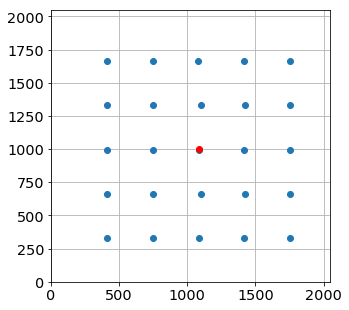

In [102]:
x_pointing = []
y_pointing = []
for index,s in enumerate(img_sources):
    for ss in s:
        x_pointing.append(ss['xcentroid']+x_guess[index]-DeltaX_rot[index])
        y_pointing.append(ss['ycentroid']+y_guess[index]-DeltaY_rot[index])
        
x_mean = np.mean(x_pointing)
y_mean = np.mean(y_pointing)
img_size=all_images[0].shape
order0_positions = np.array([x_pointing,y_pointing]).T
print order0_positions
print x_star
plt.figure(figsize=(5,5))
plt.plot(order0_positions.T[0],order0_positions.T[1],'o')
plt.plot(x_mean,y_mean,'ro')
plt.xlim(0,IMSIZE)
plt.ylim(0,IMSIZE)
plt.grid(True)

## Save results

In [34]:
newfullfilenames=[]
for idx,f in np.ndenumerate(sorted_files):
    short_infilename=f.split("/")[-1]
    short_partfilename=re.findall('^cutimg_(.*)',short_infilename)
    short_outfilename='rotimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

In [35]:
for idx,f in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_cut_rot[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(f,overwrite=True)
textfilename=os.path.join(outputdir,'star_centroids.txt')
print textfilename
np.savetxt(textfilename,order0_positions,header="y_star x_star",fmt='%d')

!ls -l rotated_fitsimages

./rotated_fitsimages/star_centroids.txt
total 80616
-rw-r--r--  1 jneveu  staff  1650240  9 aoû 16:30 rotimg_20170609_183.fits
-rw-r--r--  1 jneveu  staff  1650240  9 aoû 16:30 rotimg_20170609_184.fits
-rw-r--r--  1 jneveu  staff  1650240  9 aoû 16:30 rotimg_20170609_185.fits
-rw-r--r--  1 jneveu  staff  1650240  9 aoû 16:30 rotimg_20170609_186.fits
-rw-r--r--  1 jneveu  staff  1650240  9 aoû 16:30 rotimg_20170609_187.fits
-rw-r--r--  1 jneveu  staff  1650240  9 aoû 16:30 rotimg_20170609_188.fits
-rw-r--r--  1 jneveu  staff  1650240  9 aoû 16:30 rotimg_20170609_189.fits
-rw-r--r--  1 jneveu  staff  1650240  9 aoû 16:30 rotimg_20170609_190.fits
-rw-r--r--  1 jneveu  staff  1650240  9 aoû 16:30 rotimg_20170609_191.fits
-rw-r--r--  1 jneveu  staff  1650240  9 aoû 16:30 rotimg_20170609_192.fits
-rw-r--r--  1 jneveu  staff  1650240  9 aoû 16:30 rotimg_20170609_193.fits
-rw-r--r--  1 jneveu  staff  1650240  9 aoû 16:30 rotimg_20170609_194.fits
-rw-r--r--  1 jneveu  staff  1650240  9 aoû 16:3

# Extract spectra
===================================

In [36]:
outputdir="./spectrum_fitsspec"
ensure_dir(outputdir)

inputdir="./rotated_fitsimages"
SelectTagRe='^rotimg_%s_([0-9]+).fits$' % date # regular expression to select the file
SearchTagRe='^rotimg_%s_[0-9]+.fits$' % date

In [37]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


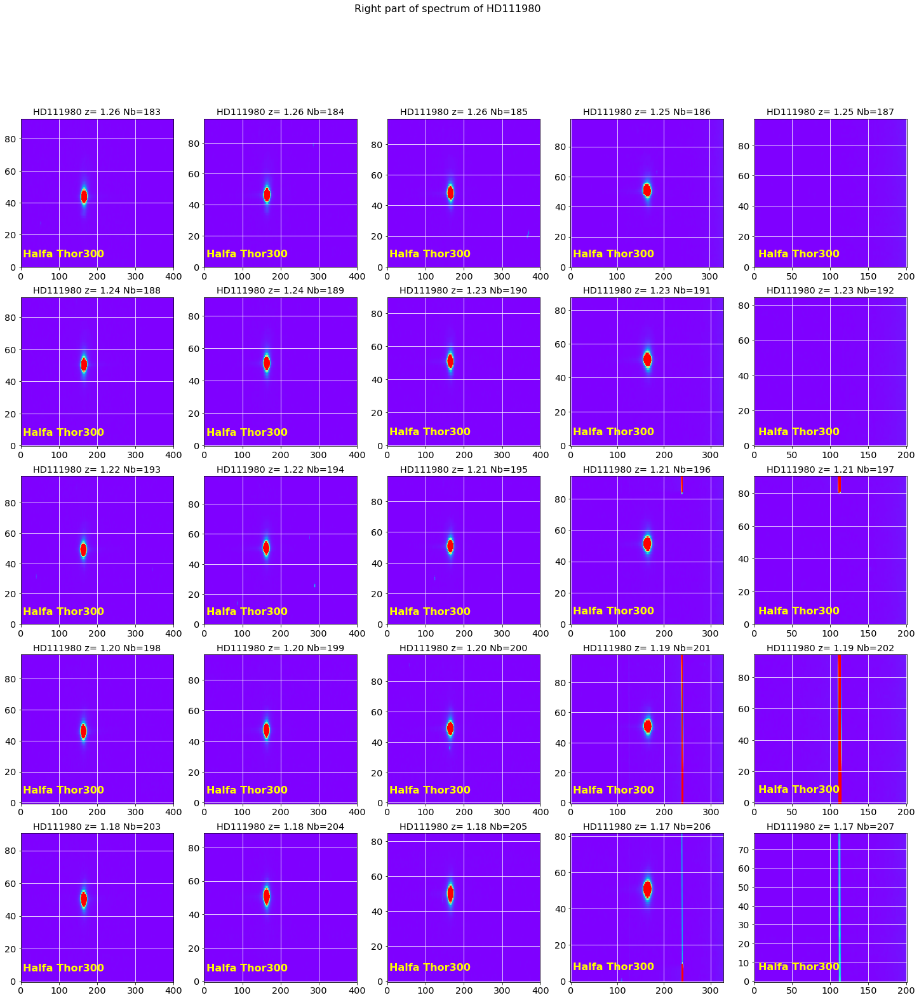

In [38]:
# Right spectrum
x_guess_right = []
for x in x_star :
    x_guess_right.append(min(IMSIZE-1,x+500))
ShowCenterImages(x_guess_right,y_star,[200]*len(all_images),[50]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000)
title='Right part of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'rightorder.pdf')
plt.savefig(figfilename)  

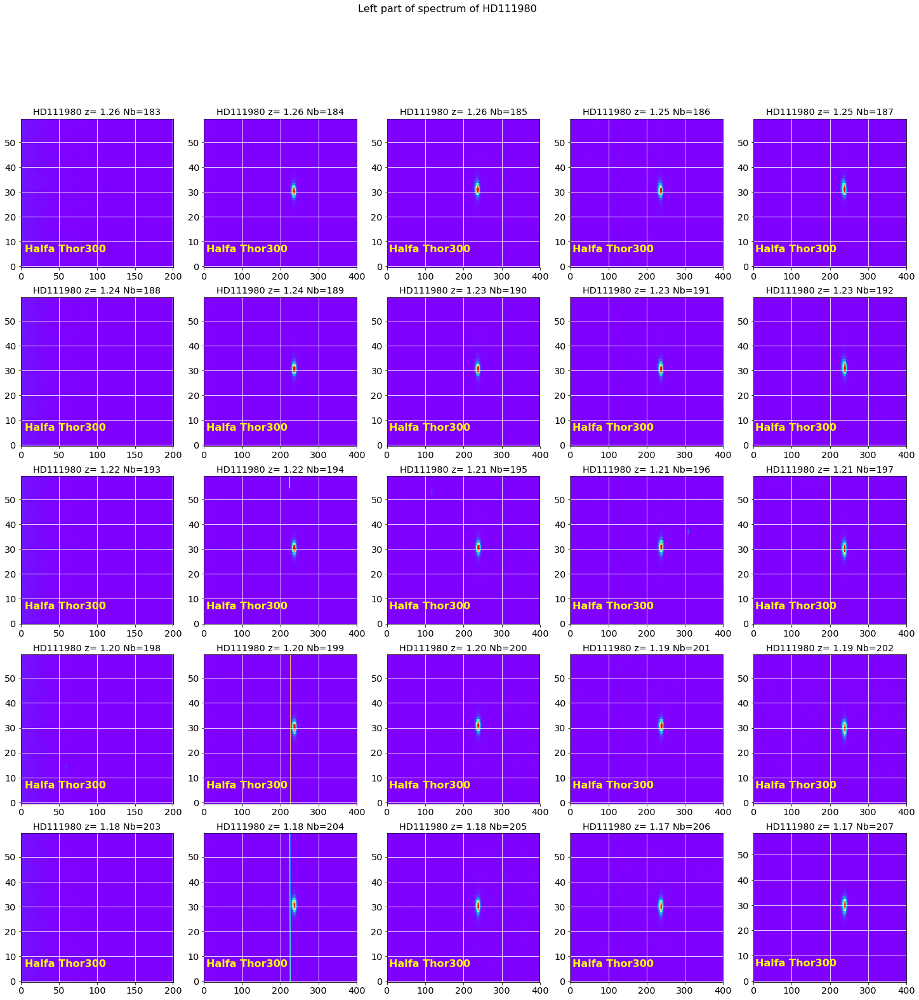

In [39]:
# Left spectrum
x_guess_left = []
for x in x_star :
    x_guess_left.append(max(1,x-500))
ShowCenterImages(x_guess_left,y_star,[200]*len(all_images),[30]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000)
title='Left part of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'leftorder.pdf')
plt.savefig(figfilename)  

### Extraction

[43,
 46,
 48,
 51,
 53,
 57,
 59,
 60,
 63,
 66,
 49,
 51,
 53,
 56,
 59,
 46,
 47,
 49,
 52,
 55,
 59,
 62,
 65,
 68,
 72]

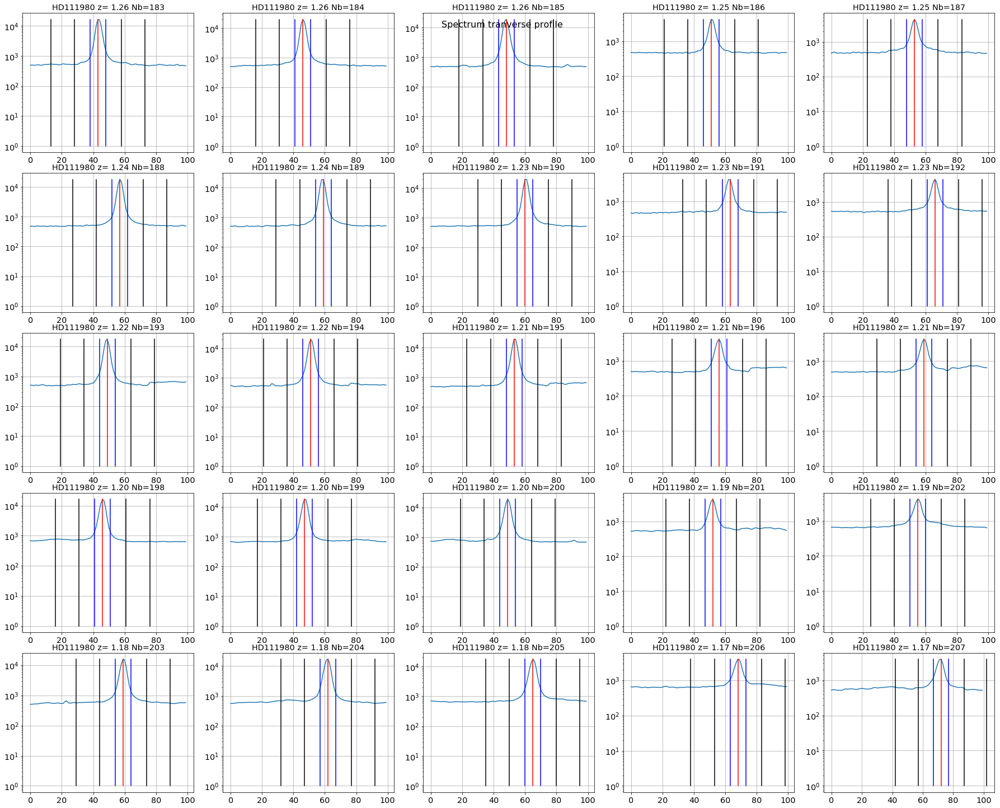

In [40]:
ShowTransverseProfile(all_images,all_titles,object_name,all_expo,NBIMGPERROW=5,DeltaX=1000,w=5,ws=[15,30],right_edge=1800)

In [41]:
thespectra,thespectraUp,thespectraDown=ExtractSpectra(y_star,all_images,all_titles,object_name,all_expo,
                                                      w=5,ws=[10,30],right_edge=IMSIZE)

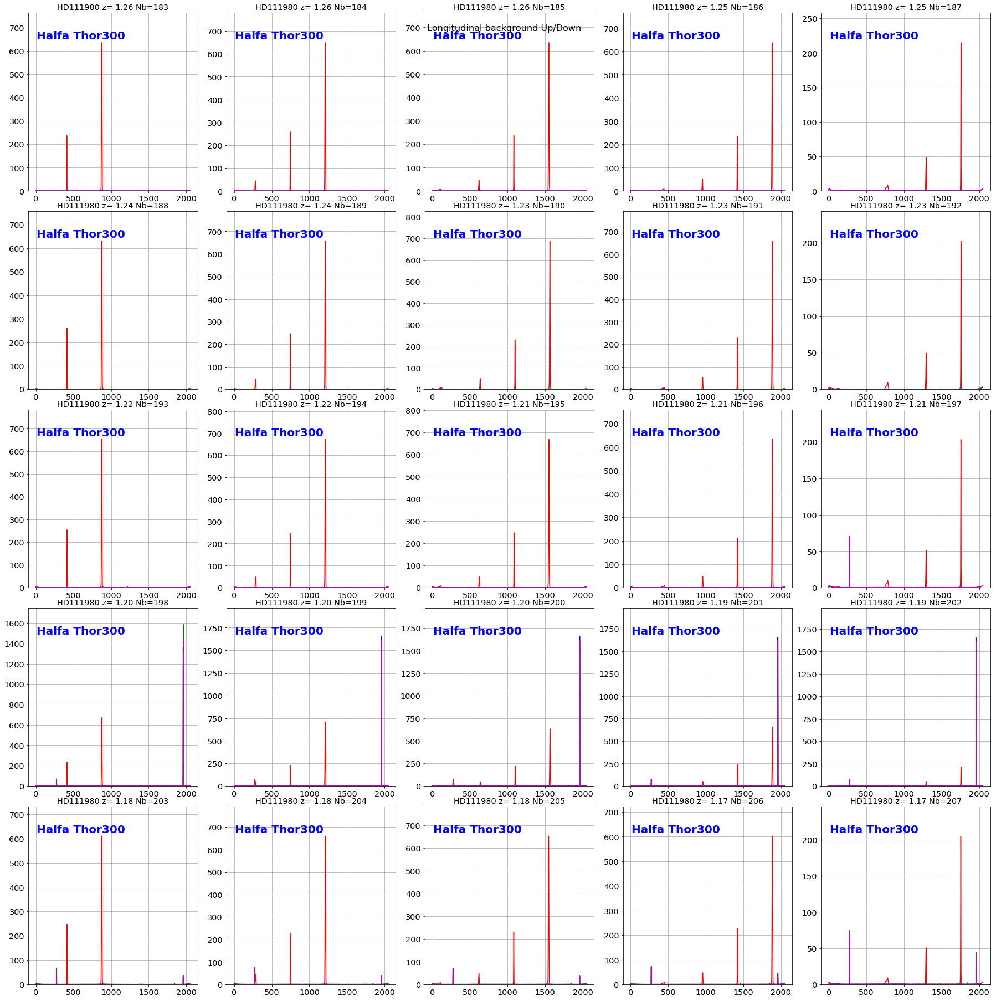

In [42]:
Clean_Up, Clean_Do,Clean_Av=CleanBadPixels(thespectraUp,thespectraDown) 

ShowLongitBackground(thespectra,Clean_Up,Clean_Do,Clean_Av,all_titles,all_filt,object_name,
                     NBIMGPERROW=5,right_edge=IMSIZE)
figfilename=os.path.join(dir_top_images,'background_longprofile.pdf')
plt.savefig(figfilename)   

(0, 800.0)

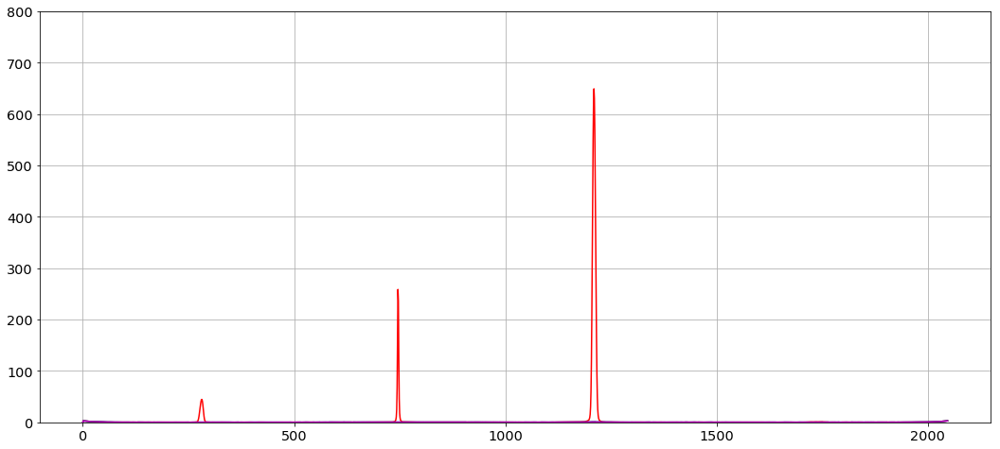

In [43]:
sel=1
plt.figure(figsize=(18,8))
plt.plot(thespectra[sel],'r-') 
plt.plot(Clean_Up[sel],'b-') 
plt.plot(Clean_Do[sel],'g-')
plt.plot(Clean_Av[sel],'m-')
plt.grid(True)
plt.ylim(0,800.)

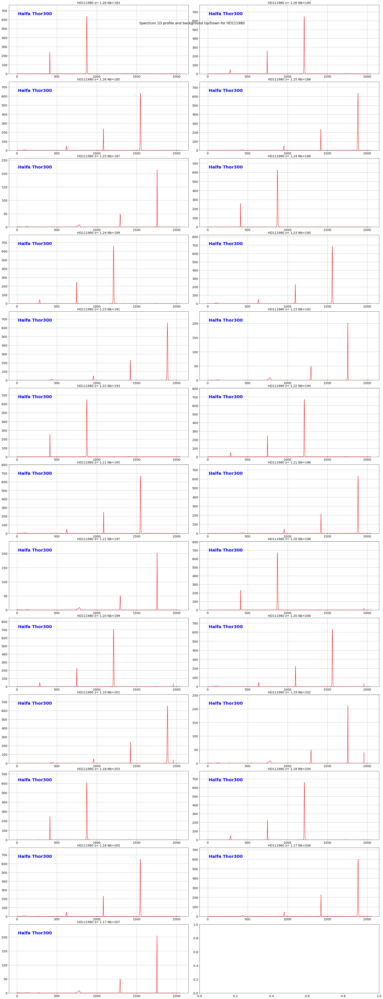

In [44]:
thecorrspectra=CorrectSpectrumFromBackground(thespectra,Clean_Av)

ShowSpectrumProfile(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=2)
figfilename=os.path.join(dir_top_images,'correctedspectrum_profile.pdf')
plt.savefig(figfilename) 

# Grating characterisation

Halfa Thor300:	 gaussian center x=410.47+/-0.02
Halfa Thor300:	 gaussian center x=746.33+/-0.02
Halfa Thor300:	 gaussian center x=1083.15+/-0.02
Halfa Thor300:	 gaussian center x=1418.27+/-0.02
Halfa Thor300:	 gaussian center x=1756.78+/-0.02
Halfa Thor300:	 gaussian center x=411.86+/-0.02
Halfa Thor300:	 gaussian center x=747.51+/-0.02
Halfa Thor300:	 gaussian center x=1098.41+/-0.02
Halfa Thor300:	 gaussian center x=1420.51+/-0.02
Halfa Thor300:	 gaussian center x=1756.94+/-0.02
Halfa Thor300:	 gaussian center x=412.16+/-0.02
Halfa Thor300:	 gaussian center x=749.02+/-0.02
Halfa Thor300:	 gaussian center x=1085.91+/-0.02
Halfa Thor300:	 gaussian center x=1420.55+/-0.02
Halfa Thor300:	 gaussian center x=1756.23+/-0.02
Halfa Thor300:	 gaussian center x=412.36+/-0.02
Halfa Thor300:	 gaussian center x=748.53+/-0.02
Halfa Thor300:	 gaussian center x=1100.59+/-0.02
Halfa Thor300:	 gaussian center x=1421.82+/-0.02
Halfa Thor300:	 gaussian center x=1757.48+/-0.03
Halfa Thor300:	 gaussian cen

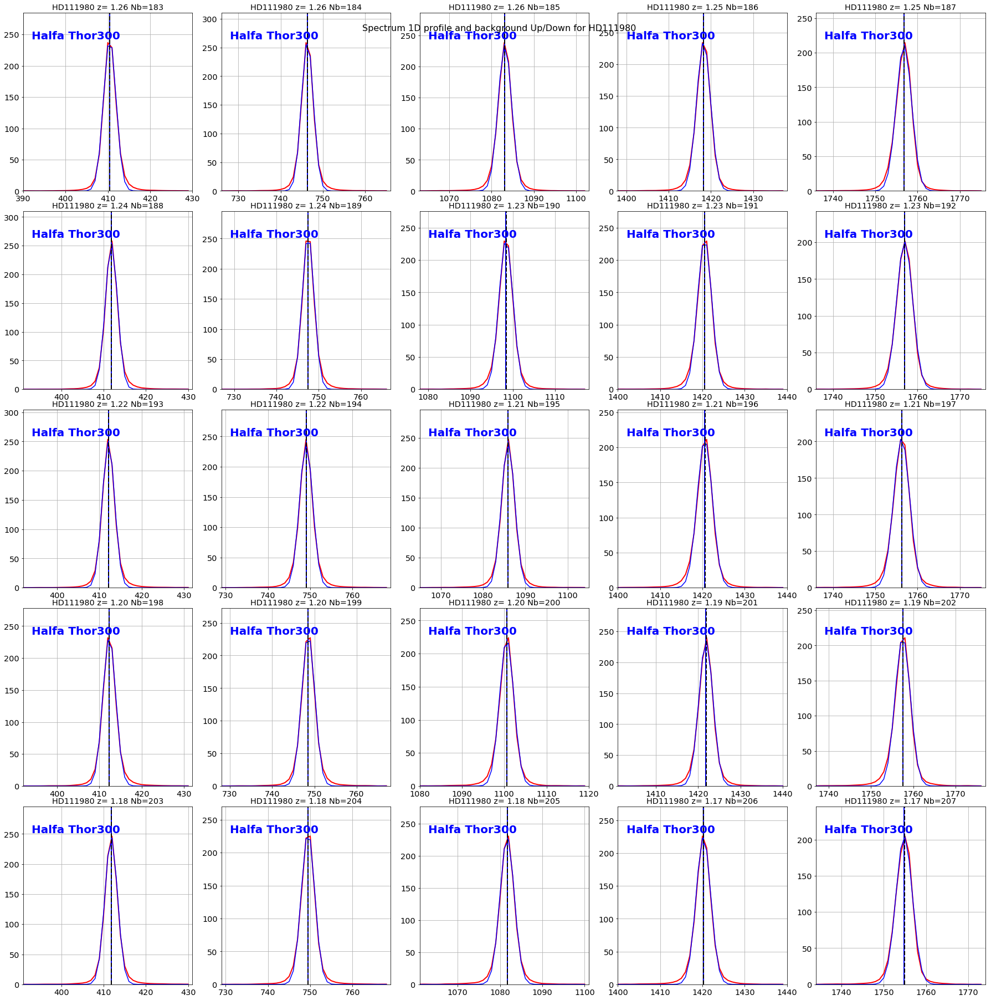

In [90]:
# Zero order profile
xlims_zero = []
for x in x_star :
    xlims_zero.append([x-20,x+20])
ShowSpectrumProfileFit(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,
                       xlim=xlims_zero,guess=[10,800,100],vertical_lines=x_star)
print 'CCDPROC star centers:'
print x_star

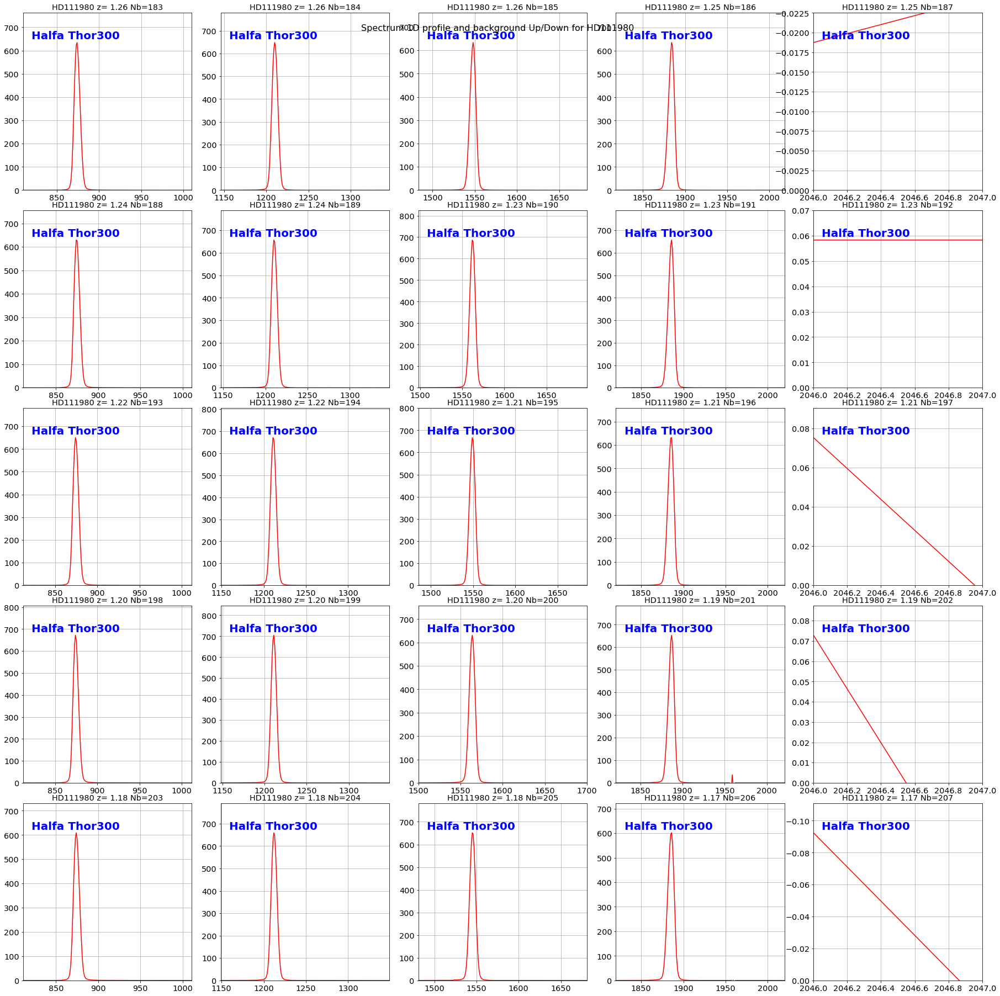

In [46]:
# Right spectrum profile
right_edge = thecorrspectra[0].shape[0]
xlims_right = []
for x in x_guess_right :
    if x == right_edge-1 :
        xlims_right.append([IMSIZE-2,IMSIZE-1])
    else :
        xlims_right.append([max(1,min(right_edge-2,int(x-100))),min(right_edge-1,int(x+100))])
ShowSpectrumProfile(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,xlim=xlims_right)

Halfa Thor300:	 gaussian center x=873.98+/-0.02
Halfa Thor300:	 gaussian center x=1210.20+/-0.01
Halfa Thor300:	 gaussian center x=1547.72+/-0.01
Halfa Thor300:	 gaussian center x=1883.83+/-0.02
Halfa Thor300:	 gaussian center x=874.66+/-0.02
Halfa Thor300:	 gaussian center x=1210.50+/-0.01
Halfa Thor300:	 gaussian center x=1562.24+/-0.01
Halfa Thor300:	 gaussian center x=1885.54+/-0.02
Halfa Thor300:	 gaussian center x=874.44+/-0.01
Halfa Thor300:	 gaussian center x=1211.40+/-0.00
Halfa Thor300:	 gaussian center x=1549.11+/-0.01
Halfa Thor300:	 gaussian center x=1885.20+/-0.02
Halfa Thor300:	 gaussian center x=874.42+/-0.02
Halfa Thor300:	 gaussian center x=1210.89+/-0.00
Halfa Thor300:	 gaussian center x=1563.82+/-0.01
Halfa Thor300:	 gaussian center x=1886.65+/-0.02
Halfa Thor300:	 gaussian center x=874.27+/-0.01
Halfa Thor300:	 gaussian center x=1212.28+/-0.01
Halfa Thor300:	 gaussian center x=1545.36+/-0.01
Halfa Thor300:	 gaussian center x=1885.28+/-0.02


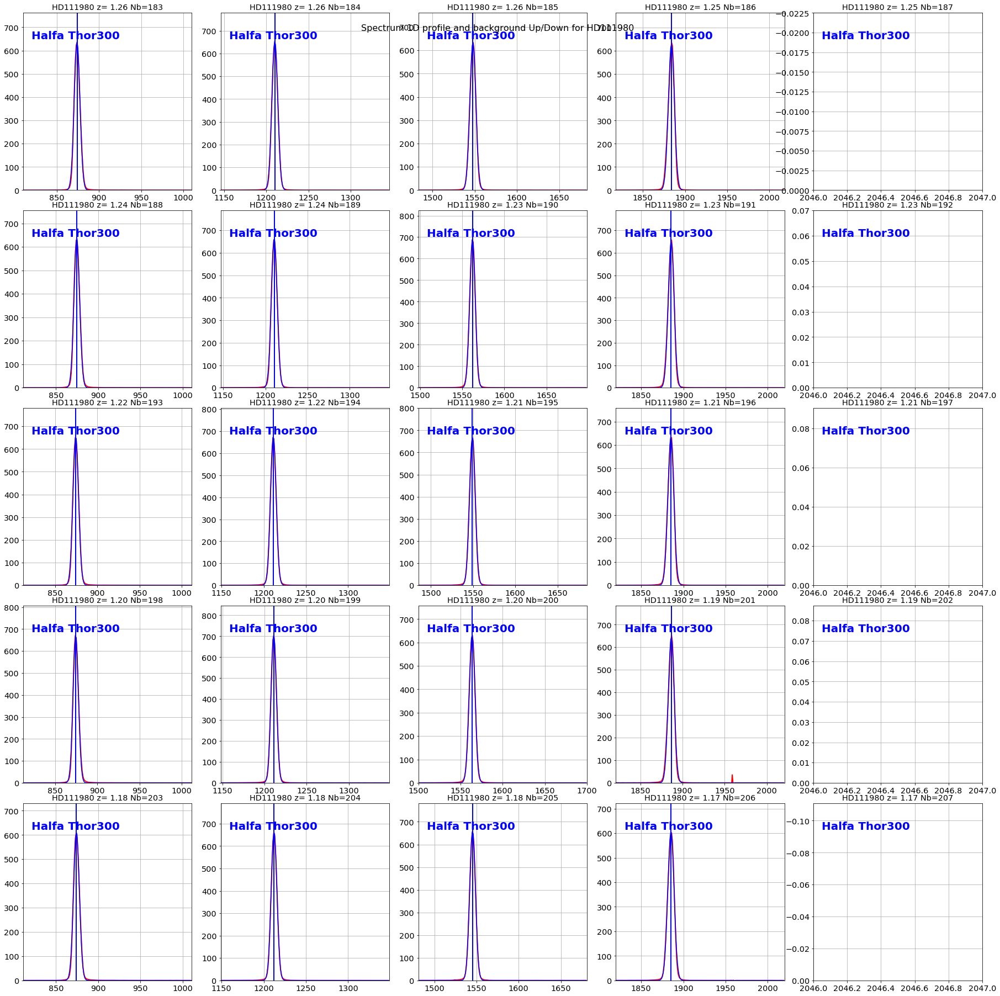

In [47]:
ShowSpectrumProfileFit(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,
                            xlim=xlims_right,guess=[10,1320,50])
figfilename=os.path.join(dir_top_images,'correctedspectrum_rightprofile2.pdf')
plt.savefig(figfilename)  

Halfa Thor300:	 gaussian center x=281.13+/-0.02
Halfa Thor300:	 gaussian center x=618.89+/-0.02
Halfa Thor300:	 gaussian center x=954.65+/-0.03
Halfa Thor300:	 gaussian center x=1293.54+/-0.04
Halfa Thor300:	 gaussian center x=282.94+/-0.01
Halfa Thor300:	 gaussian center x=634.96+/-0.02
Halfa Thor300:	 gaussian center x=957.61+/-0.03
Halfa Thor300:	 gaussian center x=1294.37+/-0.04
Halfa Thor300:	 gaussian center x=285.01+/-0.01
Halfa Thor300:	 gaussian center x=623.10+/-0.02
Halfa Thor300:	 gaussian center x=958.15+/-0.02
Halfa Thor300:	 gaussian center x=1294.00+/-0.03
Halfa Thor300:	 gaussian center x=284.52+/-0.04
Halfa Thor300:	 gaussian center x=637.71+/-0.02
Halfa Thor300:	 gaussian center x=959.63+/-0.03
Halfa Thor300:	 gaussian center x=1295.35+/-0.03
Halfa Thor300:	 gaussian center x=285.15+/-0.04
Halfa Thor300:	 gaussian center x=618.33+/-0.02
Halfa Thor300:	 gaussian center x=957.61+/-0.02
Halfa Thor300:	 gaussian center x=1292.50+/-0.04


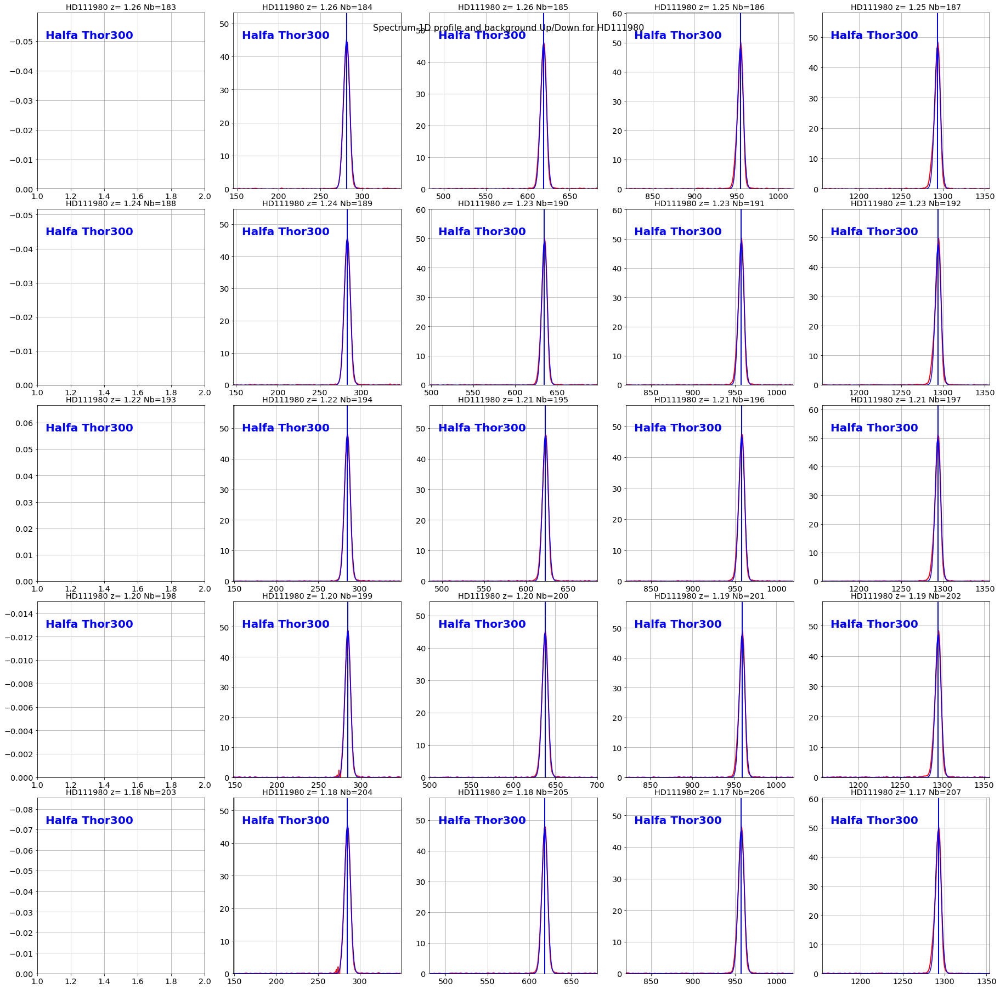

In [48]:
# Left profile
right_edge = thecorrspectra[0].shape[0]
xlims_left = []
for x in x_guess_left :
    if x == 1 :
        xlims_left.append([1,2])
    else :
        xlims_left.append([max(1,min(right_edge-2,int(x-100))),min(right_edge-1,int(x+100))])
ShowSpectrumProfileFit(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,
                            xlim=xlims_left,guess=[1,200,50])
figfilename=os.path.join(dir_top_images,'correctedspectrum_leftprofile2.pdf')
plt.savefig(figfilename)  

Present distance to CCD : 55.45 mm (to update if necessary)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : 463.52 +/- 0.02 pixels (0.00 percent) std: 3.42 pixels
300.050205189
300.050306693
Deduced distance to CCD with Halfa Thor300 : 55.44 +/- 0.19 mm (0.35 percent)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : 463.88 +/- 0.01 pixels (0.00 percent) std: 3.47 pixels
300.010998067
300.011094845
Deduced distance to CCD with Halfa Thor300 : 55.48 +/- 0.19 mm (0.35 percent)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : 464.59 +/- 0.01 pixels (0.00 percent) std: 3.54 pixels
299.971475184
299.971573566
Deduced distance to CCD with Halfa Thor300 : 55.56 +/- 0.19 mm (0.35 percent)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : 465.54 +/- 0.02 pixels (0.01 percent) std: 3.59 pixels
299.984596678
299.984777948
Deduced distance to CCD with H

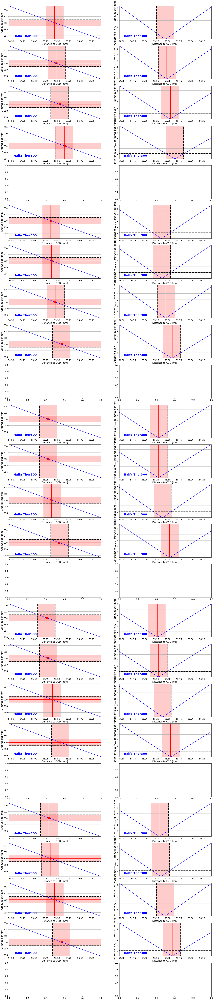

Present distance to CCD : 55.45 mm (to update if necessary)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : -465.19 +/- 0.02 pixels (-0.00 percent) std: 3.64 pixels
299.994944865
299.994847039
Deduced distance to CCD with Halfa Thor300 : 55.62 +/- 0.20 mm (0.36 percent)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : -464.25 +/- 0.02 pixels (-0.01 percent) std: 3.49 pixels
299.992227449
299.992129279
Deduced distance to CCD with Halfa Thor300 : 55.52 +/- 0.19 mm (0.35 percent)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : -463.64 +/- 0.03 pixels (-0.01 percent) std: 3.36 pixels
299.983421184
299.983242687
Deduced distance to CCD with Halfa Thor300 : 55.46 +/- 0.19 mm (0.35 percent)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : -463.30 +/- 0.04 pixels (-0.01 percent) std: 3.45 pixels
300.041530181
300.041442243
Deduced distance to CC

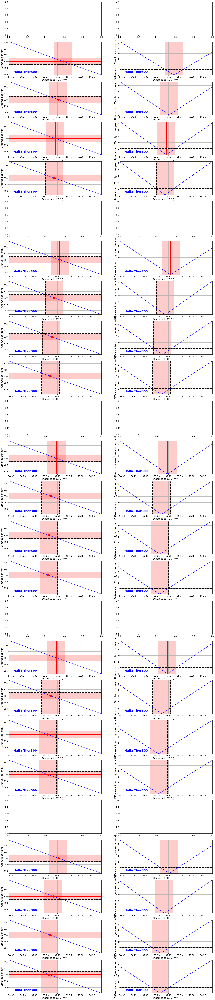

-------------------------------
Average distance to CCD : 55.42 +/- 0.19 mm (0.35 percent)


In [117]:
guess = [1,1320,50]
distance_rightorder, distance_rightorder_err, distances = CalibrateDistance2CCD_OneOrder(thecorrspectra,
                            x_star,order0_positions,all_filt,xlims_right,guess,order=1)

guess=[10,200,100]
distance_leftorder, distance_leftorder_err, distances = CalibrateDistance2CCD_OneOrder(thecorrspectra,
                            x_star,order0_positions,all_filt,xlims_left,guess,order=-1)

print '-------------------------------'  
distance_mean = np.mean([distance_rightorder,distance_leftorder])
distance_mean_err = np.sqrt(np.mean(np.array([distance_rightorder_err,distance_leftorder_err])**2))
print 'Average distance to CCD : %.2f +/- %.2f mm (%.2f percent)' % (distance_mean,distance_mean_err,100*distance_mean_err/distance_mean)

The DISTANCE2CCD value shifts in opposite way accross the images if we use the right or left order spectra. It meens that the uncertainty comes from the position of the star center along the x axis. The determinantion with both orders can remove this effect.

Present distance to CCD : 55.45 mm (to update if necessary)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : 464.54 +/- 0.01 pixels (0.00 percent)
Deduced distance to CCD with Halfa Thor300 : 55.56 +/- 0.19 mm (0.35 percent)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : 464.42 +/- 0.01 pixels (0.00 percent)
Deduced distance to CCD with Halfa Thor300 : 55.54 +/- 0.19 mm (0.35 percent)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : 464.59 +/- 0.02 pixels (0.00 percent)
Deduced distance to CCD with Halfa Thor300 : 55.56 +/- 0.19 mm (0.35 percent)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : 463.78 +/- 0.01 pixels (0.00 percent)
Deduced distance to CCD with Halfa Thor300 : 55.46 +/- 0.19 mm (0.35 percent)
-------------------------------
Halfa Thor300
Position of the H-alpha emission line : 463.64 +/- 0.01 pixels (0.00 percent)
Deduced 

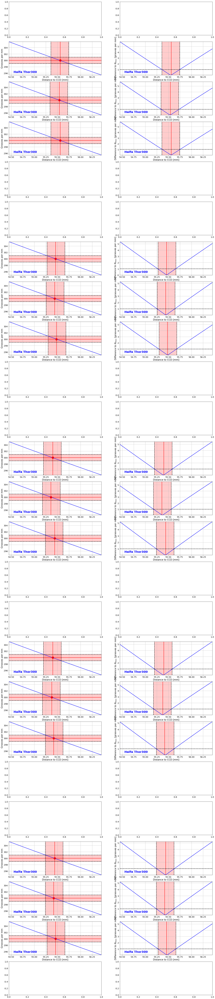

In [61]:
distance_mean, distance_mean_err, distances = CalibrateDistance2CCD_TwoOrder(thecorrspectra,all_filt,
    leftorder_edges=xlims_left,rightorder_edges=xlims_right,guess=[[10,200,200],[1,1320,50]],bounds=(-np.inf,np.inf))

### Conclusion on DISTANCE2CCD

The Thor300 gratings was mounted on the same plastic frame as the holograms, thus the DISTANCE2CCD is expected to closer to the reality for those. The Ron400 H-ampha peaks are unforcused. The Thor300 +1 and -1 orders are well focused then we use the Thor300 TwoOrder method to fix DISTANCE2CCD.

/opt/local/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/scipy/interpolate/_fitpack_impl.py:975: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=6,6 m=15 fp=0.000252 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))


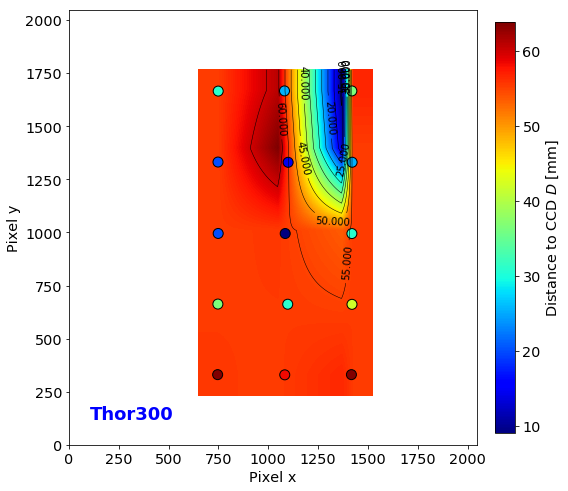

In [51]:
margin = 100

y = []
x = []
d = []
for k in range(len(distances)):
    if np.isnan(distances[k]) : continue
    y.append((order0_positions.T)[1][k])
    x.append((order0_positions.T)[0][k])
    d.append(distances[k])
xx,yy,z,interp = scatter_interpol(np.array([y,x]).T,d,margin=margin,kind='linear')

fig = plt.figure(figsize=(8,8))
plt.scatter(x, y, c=d, s=100, cmap=cm.jet, marker='o', vmin=np.min(d), vmax=np.max(d),edgecolors='k')
im = plt.imshow(z, extent=[np.min(x)-margin, np.max(x)+margin, np.min(y)-margin, np.max(y)+margin],origin='lower',aspect='auto',cmap=cm.jet)
plt.xlabel('Pixel x')
plt.ylabel('Pixel y')
plt.annotate(holo_name,xy=(0.05,0.05),xytext=(0.05,0.05),horizontalalignment='left',
             verticalalignment='bottom',fontweight='bold',color='blue',fontsize=18,xycoords='axes fraction')
plt.xlim([0,IMSIZE])
plt.ylim([0,IMSIZE])

#xx,yy,z,interp = scatter_interpol(np.array([y,x]).T,d,margin=margin)
CS = plt.contour(xx,yy,z,10,linewidths=0.5,colors='k')
plt.clabel(CS, inline=1, fontsize=10)

cb = fig.colorbar(im,fraction=0.046, pad=0.04)#, cax=cbar_ax)
#cb.formatter.set_powerlimits((0, 0))
cb.update_ticks()
cb.set_label('Distance to CCD $D$ [mm]') #,fontsize=16)

plt.show()

## Resolution of the holograms

With the +1 order

In [119]:
guess = [1,1320,50]
N_rightorder, N_rightorder_err = GratingResolution_OneOrder(thecorrspectra,
                                        x_star,order0_positions,all_images,all_filt,xlims_right,guess,order=+1)

H-alpha filter center: 655.9nm 
H-alpha filter width: 6.4nm

Halfa Thor300
N=300.0 +/- 1.0 lines/mm	 H-alpha FWHM=8.0pix with res=1.182nm/pix : FWHM=9.5nm	 ie finesse=211.0
Transverse profile FWHM=3.7pix 
-------------------------------
Halfa Thor300
N=300.2 +/- 1.0 lines/mm	 H-alpha FWHM=8.2pix with res=1.003nm/pix : FWHM=8.2nm	 ie finesse=364.8
Transverse profile FWHM=3.5pix 
-------------------------------
Halfa Thor300
N=300.5 +/- 1.0 lines/mm	 H-alpha FWHM=8.3pix with res=0.826nm/pix : FWHM=6.9nm	 ie finesse=1346.0
Transverse profile FWHM=3.7pix 
-------------------------------
Halfa Thor300
N=301.1 +/- 1.0 lines/mm	 H-alpha FWHM=8.4pix with res=0.668nm/pix : FWHM=5.6nm	 ie finesse=-868.5
Transverse profile FWHM=3.6pix 
-------------------------------
Halfa Thor300
N=299.6 +/- 1.0 lines/mm	 H-alpha FWHM=7.9pix with res=1.183nm/pix : FWHM=9.4nm	 ie finesse=222.0
Transverse profile FWHM=3.3pix 
-------------------------------
Halfa Thor300
N=299.6 +/- 1.0 lines/mm	 H-alpha FWHM=8.1p

With the two orders

In [99]:
Ns, N_errs = GratingResolution_TwoOrder(thecorrspectra,all_images,all_filt,
                        leftorder_edges=xlims_left,rightorder_edges=xlims_right,guess=[[10,200,100],[1,1320,50]])

H-alpha filter center: 655.9nm 
H-alpha filter width: 6.4nm

464.535649717
Halfa Thor300
N=300.5 +/- 1.0 lines/mm
Right order: H-alpha FWHM=8.2pix with res=1.322nm/pix : FWHM=10.8nm	 ie finesse=148.8
Left  order: H-alpha FWHM=8.6pix with res=1.322nm/pix : FWHM=11.3nm	 ie finesse=133.1
Transverse profile FWHM :  3.5pix (right)  3.5pix (left)
-------------------------------
464.416880279
Halfa Thor300
N=300.5 +/- 1.0 lines/mm
Right order: H-alpha FWHM=8.3pix with res=1.322nm/pix : FWHM=11.0nm	 ie finesse=141.6
Left  order: H-alpha FWHM=8.2pix with res=1.322nm/pix : FWHM=10.9nm	 ie finesse=146.6
Transverse profile FWHM :  3.7pix (right)  3.8pix (left)
-------------------------------
464.589913243
Halfa Thor300
N=300.6 +/- 1.0 lines/mm
Right order: H-alpha FWHM=8.4pix with res=1.322nm/pix : FWHM=11.2nm	 ie finesse=137.7
Left  order: H-alpha FWHM=7.9pix with res=1.322nm/pix : FWHM=10.5nm	 ie finesse=161.7
Transverse profile FWHM :  3.6pix (right)  3.7pix (left)
-----------------------------

Grating plate center at x0 = 1024.0 and y0 = 1024.0 with average tilt of -0.6 degrees


/opt/local/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/scipy/interpolate/_fitpack_impl.py:975: RuntimeWarning: No more knots can be added because the number of B-spline
coefficients already exceeds the number of data points m.
Probable causes: either s or m too small. (fp>s)
	kx,ky=1,1 nx,ny=6,6 m=15 fp=0.001203 s=0.000000
  warnings.warn(RuntimeWarning(_iermess2[ierm][0] + _mess))


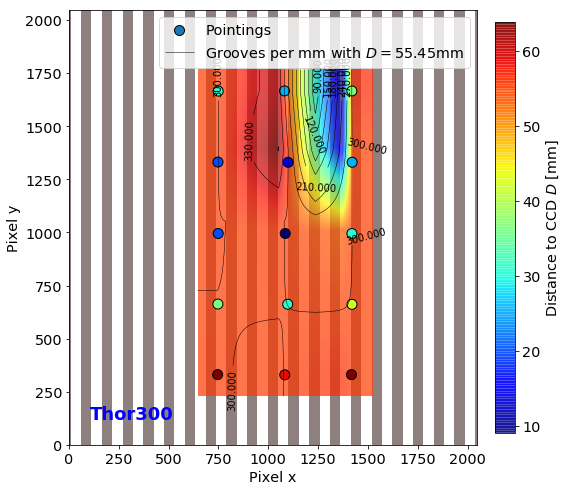

In [54]:
margin = 100

y = []
x = []
d = []
N = []
for k in range(len(distances)):
    if np.isnan(distances[k]) : continue
    y.append((order0_positions.T)[1][k])
    x.append((order0_positions.T)[0][k])
    d.append(distances[k])
    N.append(Ns[k])
xx,yy,z,interp = scatter_interpol(np.array([y,x]).T,d,margin=margin,kind='linear')

G= Grating(400,label=holo_name)
ronchi = build_ronchi(G.plate_center[0],G.plate_center[1],G.theta_tilt,grooves=0.4)

fig = plt.figure(figsize=(8,8))

plt.imshow(ronchi,origin='lower', alpha=0.5, cmap=cm.pink)

plt.scatter(x, y, c=d, s=100, cmap=cm.jet, marker='o', vmin=np.min(d), vmax=np.max(d),edgecolors='k',label='Pointings')
im = plt.imshow(z, extent=[np.min(x)-margin, np.max(x)+margin, np.min(y)-margin, np.max(y)+margin],origin='lower',aspect='auto',alpha=0.7,cmap=cm.jet)
plt.xlabel('Pixel x')
plt.ylabel('Pixel y')
plt.annotate(holo_name,xy=(0.05,0.05),xytext=(0.05,0.05),horizontalalignment='left',
             verticalalignment='bottom',fontweight='bold',color='blue',fontsize=18,xycoords='axes fraction')
plt.xlim([0,IMSIZE])
plt.ylim([0,IMSIZE])

xx,yy,z,interp = scatter_interpol(np.array([y,x]).T,N,margin=margin,kind='linear')
CS = plt.contour(xx,yy,z,10,linewidths=0.5,colors='k',label='Grooves per mm')
plt.clabel(CS, inline=1, fontsize=10)
labels = ['Grooves per mm with $D=%.4g$mm' % DISTANCE2CCD]
for i in range(len(labels)):
    CS.collections[i].set_label(labels[i])


cb = fig.colorbar(im,fraction=0.046, pad=0.04)#, cax=cbar_ax)
#cb.formatter.set_powerlimits((0, 0))
cb.update_ticks()
cb.set_label('Distance to CCD $D$ [mm]') #,fontsize=16)
plt.legend()
plt.show()

## Save grating resolution

In [55]:
N = []
Nerr = []
for k in range(len(Ns)):
    if np.isnan(Ns[k]): continue
    N.append(Ns[k])
    Nerr.append(N_errs[k])
N_mean = np.mean(N)
N_mean_err = np.sqrt(np.mean(np.array(Nerr)**2))
print 'With distance to CCD = %.2f +/- %.2f mm' % (DISTANCE2CCD, DISTANCE2CCD_ERR)
print 'Average grooves per mm : %.2f +/- %.2f /mm (%.2f percent)' % (N_mean,N_mean_err,100*N_mean_err/N_mean)

dirname = "../../common_tools/data/"+holo_name
ensure_dir(dirname)
#print 'Save results in ',dirname
#np.savetxt(dirname+'/N.txt',[N_mean,N_mean_err])

With distance to CCD = 55.45 +/- 0.19 mm
Average grooves per mm : 300.00 +/- 0.99 /mm (0.33 percent)


## Save spectra

In [56]:
newfullfilenames=[]
for idx,file in np.ndenumerate(sorted_files):
    short_infilename=file.split("/")[2]
    short_partfilename=re.findall('^rotimg_(.*)',short_infilename)
    short_outfilename='finalSpectra_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

for idx,file in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=thecorrspectra[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(file,clobber=True)
    
!ls -l spectrum_fitsspec

total 1600
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_183.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_184.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_185.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_186.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_187.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_188.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_189.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_190.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_191.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_192.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_193.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû 16:32 finalSpectra_20170609_194.fits
-rw-r--r--  1 jneveu  staff  28800  9 aoû